In [5]:
import glob
for path in glob.glob("**/data.mat", recursive=True):
    print(path)


exp/datasets/anes_data/simu/1/data.mat
exp/datasets/anes_data/simu/2/data.mat
exp/datasets/anes_data/simu/3/data.mat
exp/datasets/anes_data/simu/4/data.mat
exp/datasets/anes_data/vivo/data.mat


In [6]:
# Define a reusable function to convert RF to B-mode and match bmode_GT
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    """
    Convert RF data to B-mode and match the intensity profile to the provided ground truth B-mode image.
    
    Parameters
    ----------
    RF : np.ndarray
        3D RF data with shape (H, W, N), where N is the number of frames.
    GT_bmode : np.ndarray
        Ground truth B-mode image for histogram matching (should match shape (H, W)).
    increase : float
        Small constant to avoid log(0), used during envelope detection and log compression.

    Returns
    -------
    np.ndarray
        Histogram-matched B-mode image (uint8) with shape (H, W, N).
    """
    import numpy as np
    from scipy.signal import hilbert
    from skimage.exposure import match_histograms

    if RF.ndim != 3:
        raise ValueError("RF must be a 3D array (H, W, Nframes).")

    if not np.issubdtype(RF.dtype, np.floating):
        RF = RF.astype(np.float32)

    H, W, N = RF.shape
    modeB = np.empty((H, W, N), dtype=np.uint8)

    for i in range(N):
        # Envelope detection
        env = np.abs(hilbert(RF[:, :, i], axis=0))

        # Log compression (log10)
        modeB_temp = 20.0 * np.log10(env + increase)
        modeB_temp = np.clip(modeB_temp, a_min=-60, a_max=None)

        # Normalize to 0–255
        modeB_temp -= modeB_temp.min()
        max_val = modeB_temp.max()
        if max_val > 0:
            modeB_temp = 255.0 * modeB_temp / max_val

        # Histogram match to GT
        matched = match_histograms(modeB_temp, GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode, channel_axis=None)
        modeB[:, :, i] = np.clip(matched, 0, 255).astype(np.uint8)

    return modeB



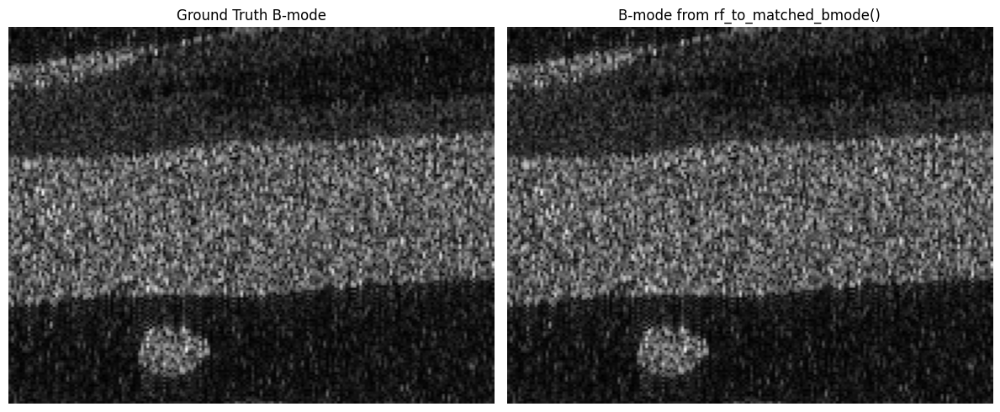

In [15]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from rf_to_matched_bmode import rf_to_matched_bmode  # Your saved function

# Load the dataset
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
data = scipy.io.loadmat(mat_path)

# Extract GT_rf and bmode_GT
GT_rf = data['GT_rf']
bmode_GT = data['bmode_GT']

# Ensure GT_rf is 3D
if GT_rf.ndim == 2:
    GT_rf = GT_rf[:, :, np.newaxis]

# Run the RF to B-mode conversion with histogram matching
matched_bmode = rf_to_matched_bmode(GT_rf, bmode_GT)

# Prepare both images for display (take the first frame only)
matched_image = matched_bmode[:, :, 0]
ground_truth_image = bmode_GT[:, :, 0] if bmode_GT.ndim == 3 else bmode_GT

# Plot side-by-side comparison
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(ground_truth_image, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(matched_image, cmap='gray', aspect='auto')
plt.title("B-mode from rf_to_matched_bmode()")
plt.axis('off')

plt.tight_layout()
plt.show()


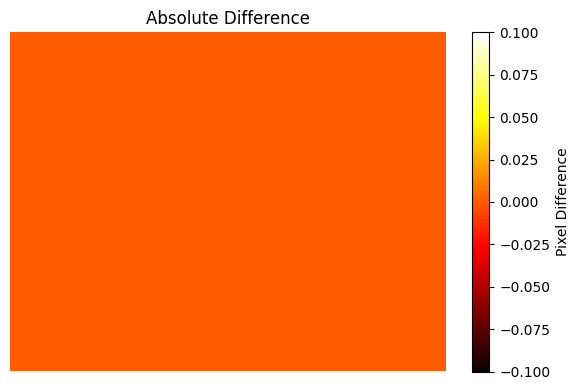

In [16]:
diff = np.abs(matched_image.astype(int) - ground_truth_image.astype(int))

plt.figure(figsize=(6, 4))
plt.imshow(diff, cmap='hot', aspect='auto')
plt.title("Absolute Difference")
plt.colorbar(label="Pixel Difference")
plt.axis("off")
plt.tight_layout()
plt.show()


In [10]:
import numpy as np
np.max(diff)

0

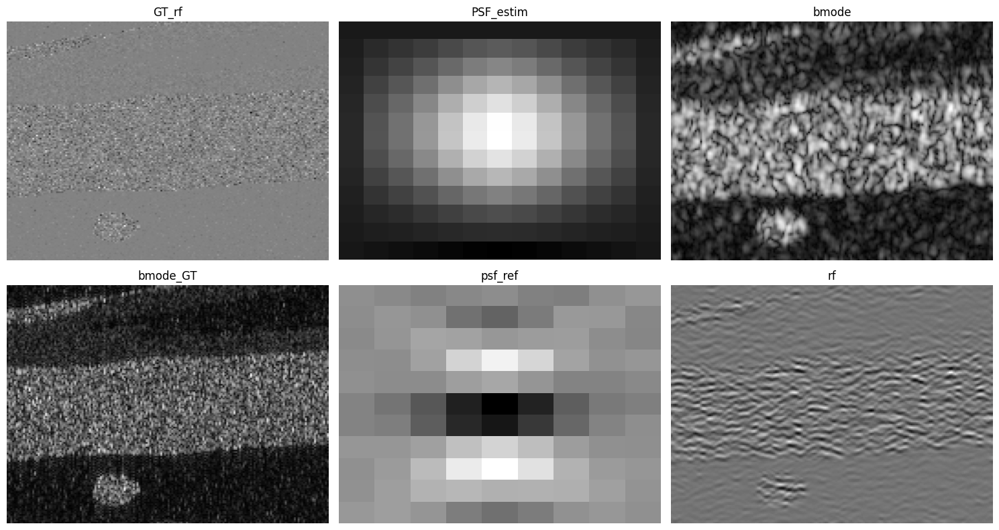

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# Variables to visualize (6 in total)
variables_to_plot = ['GT_rf', 'PSF_estim', 'bmode', 'bmode_GT', 'psf_ref', 'rf']

# Create 2 rows and 3 columns subplot
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()  # Flatten for easy indexing

for i, var in enumerate(variables_to_plot):
    if var not in mat_data:
        axes[i].set_title(f"{var} (Not Found)")
        axes[i].axis('off')
        continue

    data = mat_data[var]
    img = data[:, :, 0] if data.ndim == 3 else data

    axes[i].imshow(img, cmap='gray', aspect='auto')
    axes[i].set_title(var)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [9]:
import os

# Print all files in the current directory
print("Current directory:", os.getcwd())
print("\nFiles in current directory:")
print(os.listdir())


Current directory: /projects/minds/PDAS-M2-2025/MIRDDRM

Files in current directory:
['runners', 'models', 'inp_masks', 'guided_diffusion', 'functions', 'exp', 'datasets', 'configs', 'run_net_imgnet_512.sh', 'run_net_imgnet_256.sh', 'run_net_deblur.sh', 'README.md', 'psf_GT_2.mat', 'psf_GT_1.mat', 'psf_GT_0.mat', 'MIR_DDRM.ipynb', 'main.py', 'environment.yml', '.gitattributes', '.ipynb_checkpoints', '__pycache__', 'data-Anes.mat.zip', 'mat_output', 'DDRM_ultrasound_demo.ipynb', '256x256_diffusion_uncond.pt', 'bmode_rgb_resized.png', 'bmode_rgb_rescaled.png', 'batch_results', 'main_mat.py', 'main_sr.py', 'mat_output_rf', 'main_mat_rf.py', 'US_Manipulation.ipynb', 'rf_to_matched_bmode.py', 'main_mat_rf_patched.py', 'untitled.py', 'main_mat_ddrm.py', 'mat_output_ddrm', 'Untitled.ipynb', 'main_bmode.py', 'mat_output_bmode', 'morin_r2b.py', 'calc_performance_metrics.py']


In [10]:
!python main_mat_rf_patched.py \
  --mat_dir exp/datasets/anes_data/simu/1 \
  --mat_list exp/datasets/anes_data/simu/1/mat_list.txt \
  --key GT_rf \
  --image_size 256 \
  --psf_path psf_GT_0.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_rf \
  --config deblur_us.yml \
  --doc mat_demo_rf


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO:root:Using device: cuda
INFO:root:Using device: cuda
INFO - main.py - 2025-05-07 15:38:15,573 - Using device: cuda
INFO:root:✅ Model instantiated and checkpoint loaded.
INFO - main_mat_rf_patched.py - 2025-05-07 15:38:23,542 - ✅ Model instantiated and checkpoint loaded.
INFO:root:Loading PSF from: psf_GT_0.mat
INFO - main_mat_rf_patched.py - 2025-05-07 15:38:23,542 - Loading PSF from: psf_GT_0.mat
INFO:ro

In [18]:
import os

output_dir = "mat_output_rf"  # Update if your folder path is different
mat_files = [f for f in os.listdir(output_dir) if f.endswith('.mat')]

print("Found .mat files:")
for f in mat_files:
    print(" -", f)


Found .mat files:
 - degraded_y0.mat
 - ground_truth.mat
 - restored_ddrm.mat
 - bmode_GT.mat
 - bmode_degraded.mat
 - bmode_restored.mat


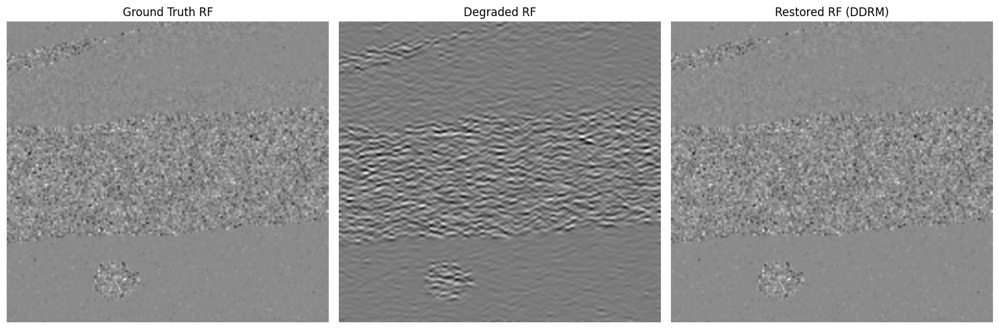

In [12]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import os

# Set the correct output path
output_dir = "mat_output_rf"

# Load each RF file
gt_rf = scipy.io.loadmat(os.path.join(output_dir, 'ground_truth.mat'))
degraded_rf = scipy.io.loadmat(os.path.join(output_dir, 'degraded_y0.mat'))
restored_rf = scipy.io.loadmat(os.path.join(output_dir, 'restored_ddrm.mat'))

# Extract the actual data (assumes each has only one main key)
gt = list(gt_rf.values())[-1]
degraded = list(degraded_rf.values())[-1]
restored = list(restored_rf.values())[-1]

# Ensure 3D format
if gt.ndim == 2: gt = gt[:, :, np.newaxis]
if degraded.ndim == 2: degraded = degraded[:, :, np.newaxis]
if restored.ndim == 2: restored = restored[:, :, np.newaxis]

# Plot side-by-side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
titles = ['Ground Truth RF', 'Degraded RF', 'Restored RF (DDRM)']
images = [gt[:, :, 0], degraded[:, :, 0], restored[:, :, 0]]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


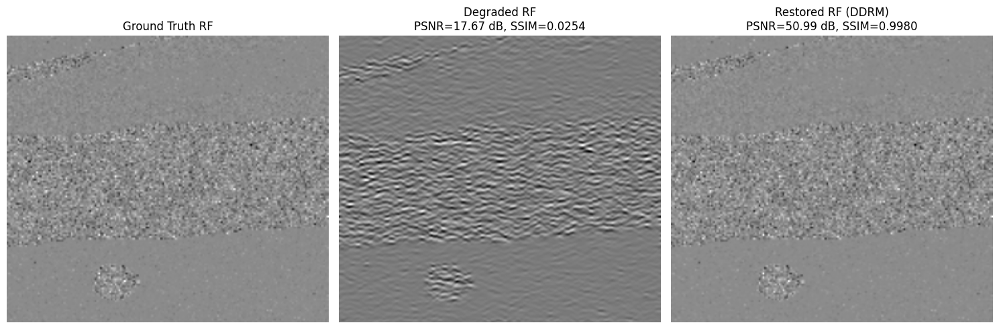

In [13]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load .mat files
output_dir = "mat_output_rf"
gt_rf = scipy.io.loadmat(os.path.join(output_dir, 'ground_truth.mat'))
degraded_rf = scipy.io.loadmat(os.path.join(output_dir, 'degraded_y0.mat'))
restored_rf = scipy.io.loadmat(os.path.join(output_dir, 'restored_ddrm.mat'))

# Extract the actual data arrays (ignoring __header__, __version__, etc.)
def extract_main(data):
    for k, v in data.items():
        if not k.startswith('__'):
            return v
gt = extract_main(gt_rf)
degraded = extract_main(degraded_rf)
restored = extract_main(restored_rf)

# Ensure 2D slices for PSNR/SSIM and visualization
gt_img = gt[:, :, 0] if gt.ndim == 3 else gt
degraded_img = degraded[:, :, 0] if degraded.ndim == 3 else degraded
restored_img = restored[:, :, 0] if restored.ndim == 3 else restored

# Normalize to [0, 1] for fair SSIM comparison
def normalize(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-8)

gt_n = normalize(gt_img)
degraded_n = normalize(degraded_img)
restored_n = normalize(restored_img)

# Compute PSNR and SSIM
psnr_deg = psnr(gt_n, degraded_n, data_range=1.0)
ssim_deg = ssim(gt_n, degraded_n, data_range=1.0)

psnr_res = psnr(gt_n, restored_n, data_range=1.0)
ssim_res = ssim(gt_n, restored_n, data_range=1.0)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
images = [gt_img, degraded_img, restored_img]
titles = [
    "Ground Truth RF",
    f"Degraded RF\nPSNR={psnr_deg:.2f} dB, SSIM={ssim_deg:.4f}",
    f"Restored RF (DDRM)\nPSNR={psnr_res:.2f} dB, SSIM={ssim_res:.4f}"
]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [20]:
import os
print(os.getcwd())


/projects/minds/PDAS-M2-2025/MIRDDRM


In [22]:
# Print shapes
print("Ground Truth B-mode shape:", bmode_GT.shape)
print("Degraded B-mode shape:    ", bmode_degraded.shape)
print("Restored B-mode shape:    ", bmode_restored.shape)

Ground Truth B-mode shape: (256, 256, 1)
Degraded B-mode shape:     (256, 256, 1)
Restored B-mode shape:     (256, 256, 1)


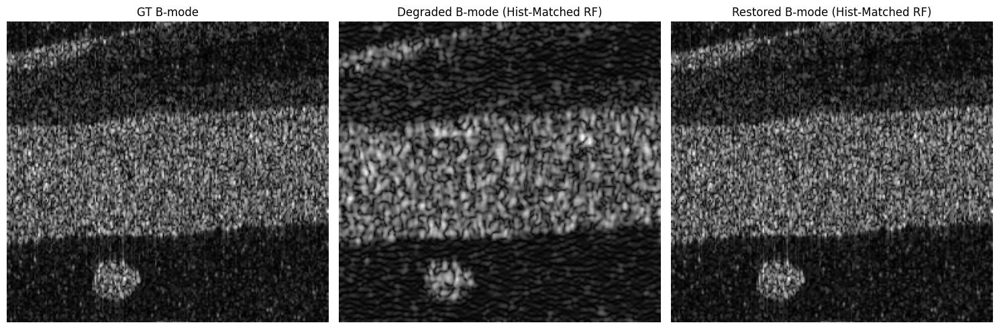

In [10]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --------------------------------------
# Define reusable function for B-mode
# --------------------------------------
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    """
    Convert RF data to B-mode and match the intensity profile to the provided ground truth B-mode image.
    """
    H, W = RF.shape
    # RF is 2D for this function
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --------------------------------------
# Load RF data
# --------------------------------------
gt_data       = scipy.io.loadmat("mat_output_rf/ground_truth.mat")
degraded_data = scipy.io.loadmat("mat_output_rf/degraded_y0.mat")
restored_data = scipy.io.loadmat("mat_output_rf/restored_ddrm.mat")


rf_gt        = gt_data["GT_rf_resized"]       # shape (256,256)
rf_degraded  = degraded_data["rf_degraded"]   # shape (256,256)
rf_restored  = restored_data["rf_restored"]   # shape (256,256)

# --------------------------------------
# Load Simu-1 ground truth B-mode
# --------------------------------------
sim_data = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
bmode_GT = sim_data['bmode_GT']               # shape (156,176)

# Resize GT RF to B-mode resolution if needed
# But rf_to_matched_bmode handles histogram matching against bmode_GT
# --------------------------------------
# Histogram‐match both degraded and restored RF to the ground truth B-mode
# --------------------------------------
rf_degraded_hist = match_histograms(rf_degraded, rf_gt, channel_axis=None)
rf_restored_hist = match_histograms(rf_restored, rf_gt, channel_axis=None)

# --------------------------------------
# Generate B‐mode images
# --------------------------------------
bmode_gt_image       = rf_to_matched_bmode(rf_gt,       bmode_GT)
bmode_degraded_image = rf_to_matched_bmode(rf_degraded_hist, bmode_GT)
bmode_restored_image = rf_to_matched_bmode(rf_restored_hist, bmode_GT)

# --------------------------------------
# Plot side‐by‐side
# --------------------------------------
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(bmode_gt_image, cmap='gray', aspect='auto')
plt.title("GT B-mode")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(bmode_degraded_image, cmap='gray', aspect='auto')
plt.title("Degraded B-mode (Hist-Matched RF)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bmode_restored_image, cmap='gray', aspect='auto')
plt.title("Restored B-mode (Hist-Matched RF)")
plt.axis('off')

plt.tight_layout()
plt.show()


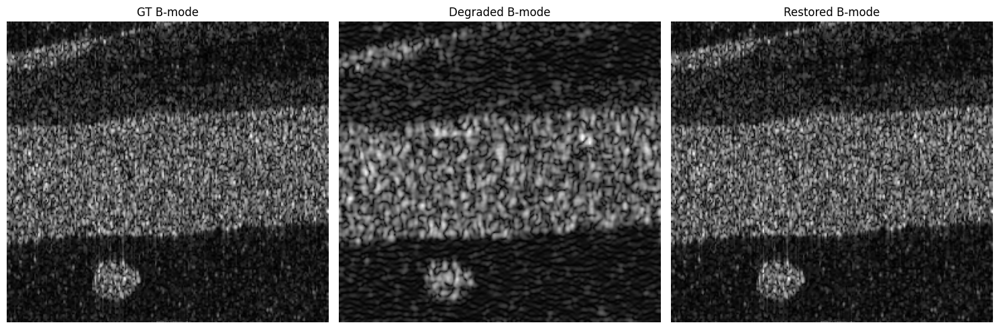

In [13]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --------------------------------------
# Define reusable B-mode conversion + matching
# --------------------------------------
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --------------------------------------
# Load RF data
# --------------------------------------
gt_mat     = scipy.io.loadmat("mat_output_rf/ground_truth.mat")
deg_mat    = scipy.io.loadmat("mat_output_rf/degraded_y0.mat")
res_mat    = scipy.io.loadmat("mat_output_rf/restored_ddrm.mat")

rf_gt      = gt_mat["GT_rf_resized"]
rf_degraded= deg_mat["rf_degraded"]
rf_restored= res_mat["rf_restored"]

# --------------------------------------
# Load Simu-1 ground-truth B-mode
# --------------------------------------
sim1       = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
bmode_GT   = sim1["bmode_GT"]

# --------------------------------------
# Match RF→RF and convert to B-mode
# --------------------------------------
rf_deg_matched = match_histograms(rf_degraded, rf_gt, channel_axis=None)
rf_res_matched = match_histograms(rf_restored, rf_gt, channel_axis=None)

bmode_gt_image       = rf_to_matched_bmode(rf_gt,        bmode_GT)
bmode_degraded_image = rf_to_matched_bmode(rf_deg_matched, bmode_GT)
bmode_restored_image = rf_to_matched_bmode(rf_res_matched, bmode_GT)

# --------------------------------------
# Plot side-by-side and save PNG
# --------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(bmode_gt_image,       cmap='gray', aspect='auto'); axes[0].axis('off'); axes[0].set_title("GT B-mode")
axes[1].imshow(bmode_degraded_image, cmap='gray', aspect='auto'); axes[1].axis('off'); axes[1].set_title("Degraded B-mode")
axes[2].imshow(bmode_restored_image, cmap='gray', aspect='auto'); axes[2].axis('off'); axes[2].set_title("Restored B-mode")
plt.tight_layout()
plt.savefig("mat_output_rf/bmode_comparison.png", dpi=300, bbox_inches='tight')

# --------------------------------------
# Save individual B-mode images to .mat
# --------------------------------------
scipy.io.savemat("mat_output_rf/bmode_degraded.mat", {"bmode_degraded": bmode_degraded_image})
scipy.io.savemat("mat_output_rf/bmode_restored.mat", {"bmode_restored": bmode_restored_image})


In [12]:
# Print shapes
print("Ground Truth B-mode shape:", bmode_gt_image.shape)
print("Degraded B-mode shape:    ", bmode_degraded_image.shape)
print("Restored B-mode shape:    ", bmode_restored_image.shape)

Ground Truth B-mode shape: (156, 176)
Degraded B-mode shape:     (256, 256)
Restored B-mode shape:     (256, 256)


In [1]:
!python main_mat_ddrm.py \
  --mat_dir exp/datasets/anes_data/simu/3 \
  --mat_list exp/datasets/anes_data/simu/3/mat_list.txt \
  --key GT_rf \
  --image_size 256 \
  --psf_path psf_GT_2.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_ddrm \
  --config deblur_us.yml \
  --doc 2


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO:root:Using device: cuda
INFO:root:Using device: cuda
INFO - main.py - 2025-05-14 11:14:14,152 - Using device: cuda
INFO:root:✅ Model instantiated and checkpoint loaded.
INFO - main_mat_ddrm.py - 2025-05-14 11:14:25,034 - ✅ Model instantiated and checkpoint loaded.
INFO:root:Loading PSF from: psf_GT_2.mat
INFO - main_mat_ddrm.py - 2025-05-14 11:14:25,034 - Loading PSF from: psf_GT_2.mat
INFO:root:✅ Found P

!python main_mat_ddrm.py \
  --mat_dir exp/datasets/anes_data/simu/1 \
  --mat_list exp/datasets/anes_data/simu/1/mat_list.txt \
  --key GT_rf \
  --image_size 256 \
  --psf_path psf_GT_1.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_ddrm \
  --config deblur_us.yml \
  --doc 2


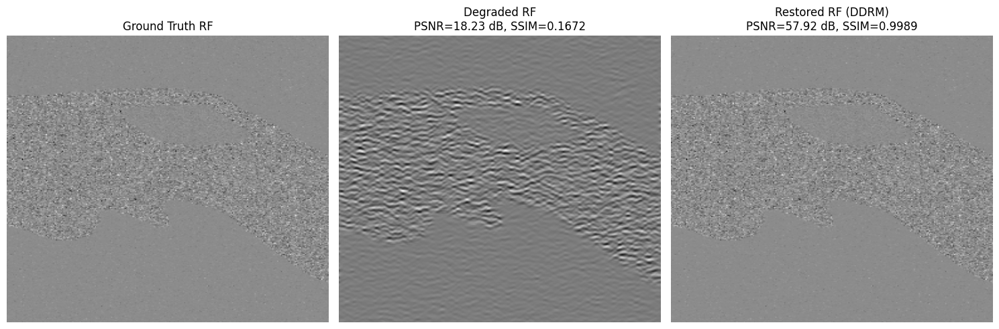

In [2]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load .mat files
output_dir = "mat_output_rf"
gt_rf = scipy.io.loadmat(os.path.join(output_dir, 'ground_truth.mat'))
degraded_rf = scipy.io.loadmat(os.path.join(output_dir, 'degraded_y0.mat'))
restored_rf = scipy.io.loadmat(os.path.join(output_dir, 'restored_ddrm.mat'))

# Extract the actual data arrays (ignoring __header__, __version__, etc.)
def extract_main(data):
    for k, v in data.items():
        if not k.startswith('__'):
            return v
gt = extract_main(gt_rf)
degraded = extract_main(degraded_rf)
restored = extract_main(restored_rf)

# Ensure 2D slices for PSNR/SSIM and visualization
gt_img = gt[:, :, 0] if gt.ndim == 3 else gt
degraded_img = degraded[:, :, 0] if degraded.ndim == 3 else degraded
restored_img = restored[:, :, 0] if restored.ndim == 3 else restored

# Normalize to [0, 1] for fair SSIM comparison
def normalize(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-8)

gt_n = normalize(gt_img)
degraded_n = normalize(degraded_img)
restored_n = normalize(restored_img)

# Compute PSNR and SSIM
psnr_deg = psnr(gt_n, degraded_n, data_range=1.0)
ssim_deg = ssim(gt_n, degraded_n, data_range=1.0)

psnr_res = psnr(gt_n, restored_n, data_range=1.0)
ssim_res = ssim(gt_n, restored_n, data_range=1.0)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
images = [gt_img, degraded_img, restored_img]
titles = [
    "Ground Truth RF",
    f"Degraded RF\nPSNR={psnr_deg:.2f} dB, SSIM={ssim_deg:.4f}",
    f"Restored RF (DDRM)\nPSNR={psnr_res:.2f} dB, SSIM={ssim_res:.4f}"
]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [14]:
!python main_mat_rf_patched.py \
  --mat_dir exp/datasets/anes_data/simu/2 \
  --mat_list exp/datasets/anes_data/simu/2/mat_list.txt \
  --key GT_rf \
  --image_size 256 \
  --psf_path psf_GT_2.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_rf \
  --config deblur_us.yml \
  --doc mat_demo_rf


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO:root:Using device: cuda
INFO:root:Using device: cuda
INFO - main.py - 2025-05-07 17:27:59,586 - Using device: cuda
INFO:root:✅ Model instantiated and checkpoint loaded.
INFO - main_mat_rf_patched.py - 2025-05-07 17:28:05,379 - ✅ Model instantiated and checkpoint loaded.
INFO:root:Loading PSF from: psf_GT_2.mat
INFO - main_mat_rf_patched.py - 2025-05-07 17:28:05,379 - Loading PSF from: psf_GT_2.mat
INFO:ro

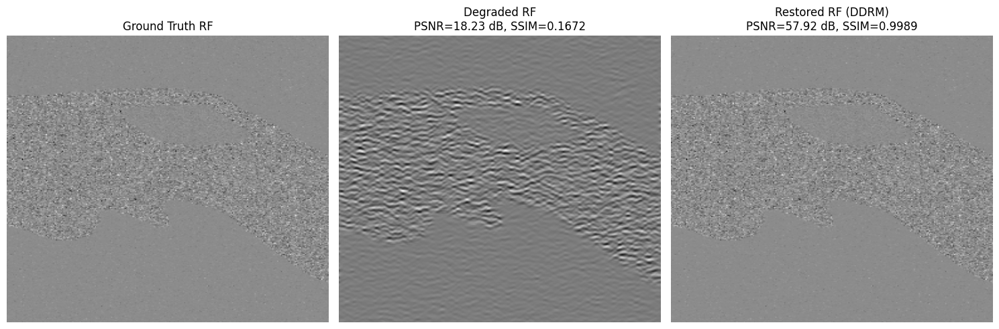

In [15]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load .mat files
output_dir = "mat_output_rf"
gt_rf = scipy.io.loadmat(os.path.join(output_dir, 'ground_truth.mat'))
degraded_rf = scipy.io.loadmat(os.path.join(output_dir, 'degraded_y0.mat'))
restored_rf = scipy.io.loadmat(os.path.join(output_dir, 'restored_ddrm.mat'))

# Extract the actual data arrays (ignoring __header__, __version__, etc.)
def extract_main(data):
    for k, v in data.items():
        if not k.startswith('__'):
            return v
gt = extract_main(gt_rf)
degraded = extract_main(degraded_rf)
restored = extract_main(restored_rf)

# Ensure 2D slices for PSNR/SSIM and visualization
gt_img = gt[:, :, 0] if gt.ndim == 3 else gt
degraded_img = degraded[:, :, 0] if degraded.ndim == 3 else degraded
restored_img = restored[:, :, 0] if restored.ndim == 3 else restored

# Normalize to [0, 1] for fair SSIM comparison
def normalize(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-8)

gt_n = normalize(gt_img)
degraded_n = normalize(degraded_img)
restored_n = normalize(restored_img)

# Compute PSNR and SSIM
psnr_deg = psnr(gt_n, degraded_n, data_range=1.0)
ssim_deg = ssim(gt_n, degraded_n, data_range=1.0)

psnr_res = psnr(gt_n, restored_n, data_range=1.0)
ssim_res = ssim(gt_n, restored_n, data_range=1.0)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
images = [gt_img, degraded_img, restored_img]
titles = [
    "Ground Truth RF",
    f"Degraded RF\nPSNR={psnr_deg:.2f} dB, SSIM={ssim_deg:.4f}",
    f"Restored RF (DDRM)\nPSNR={psnr_res:.2f} dB, SSIM={ssim_res:.4f}"
]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


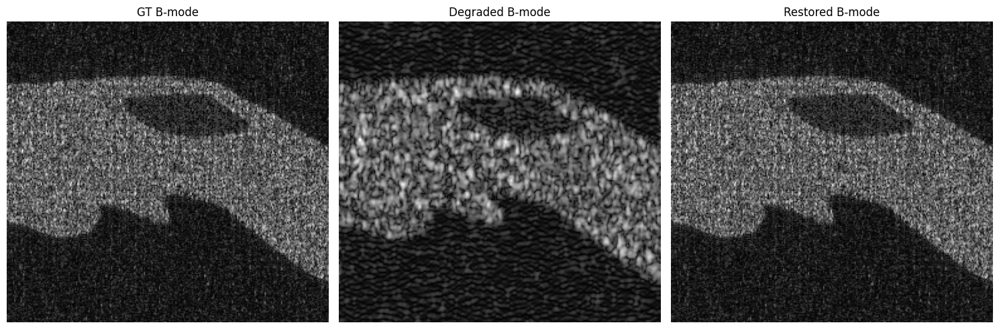

In [16]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --------------------------------------
# Define reusable B-mode conversion + matching
# --------------------------------------
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --------------------------------------
# Load RF data
# --------------------------------------
gt_mat     = scipy.io.loadmat("mat_output_rf/ground_truth.mat")
deg_mat    = scipy.io.loadmat("mat_output_rf/degraded_y0.mat")
res_mat    = scipy.io.loadmat("mat_output_rf/restored_ddrm.mat")

rf_gt      = gt_mat["GT_rf_resized"]
rf_degraded= deg_mat["rf_degraded"]
rf_restored= res_mat["rf_restored"]

# --------------------------------------
# Load Simu-1 ground-truth B-mode
# --------------------------------------
sim1       = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
bmode_GT   = sim1["bmode_GT"]

# --------------------------------------
# Match RF→RF and convert to B-mode
# --------------------------------------
rf_deg_matched = match_histograms(rf_degraded, rf_gt, channel_axis=None)
rf_res_matched = match_histograms(rf_restored, rf_gt, channel_axis=None)

bmode_gt_image       = rf_to_matched_bmode(rf_gt,        bmode_GT)
bmode_degraded_image = rf_to_matched_bmode(rf_deg_matched, bmode_GT)
bmode_restored_image = rf_to_matched_bmode(rf_res_matched, bmode_GT)

# --------------------------------------
# Plot side-by-side and save PNG
# --------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(bmode_gt_image,       cmap='gray', aspect='auto'); axes[0].axis('off'); axes[0].set_title("GT B-mode")
axes[1].imshow(bmode_degraded_image, cmap='gray', aspect='auto'); axes[1].axis('off'); axes[1].set_title("Degraded B-mode")
axes[2].imshow(bmode_restored_image, cmap='gray', aspect='auto'); axes[2].axis('off'); axes[2].set_title("Restored B-mode")
plt.tight_layout()
plt.savefig("mat_output_rf/bmode_comparison.png", dpi=300, bbox_inches='tight')

# --------------------------------------
# Save individual B-mode images to .mat
# --------------------------------------
scipy.io.savemat("mat_output_rf/bmode_degraded.mat", {"bmode_degraded": bmode_degraded_image})
scipy.io.savemat("mat_output_rf/bmode_restored.mat", {"bmode_restored": bmode_restored_image})


### Final Version 

In [19]:
!python main_mat_ddrm.py \
  --mat_dir exp/datasets/anes_data/simu/4 \
  --mat_list exp/datasets/anes_data/simu/4/mat_list.txt \
  --key GT_rf \
  --image_size 256 \
  --psf_path psf_GT_4.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_ddrm \
  --config deblur_us.yml \
  --doc 2

Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO:root:Using device: cuda
INFO:root:Using device: cuda
INFO - main.py - 2025-05-09 14:21:34,154 - Using device: cuda
INFO:root:✅ Model instantiated and checkpoint loaded.
INFO - main_mat_ddrm.py - 2025-05-09 14:21:39,849 - ✅ Model instantiated and checkpoint loaded.
INFO:root:Loading PSF from: psf_GT_4.mat
INFO - main_mat_ddrm.py - 2025-05-09 14:21:39,850 - Loading PSF from: psf_GT_4.mat
Traceback (most rec

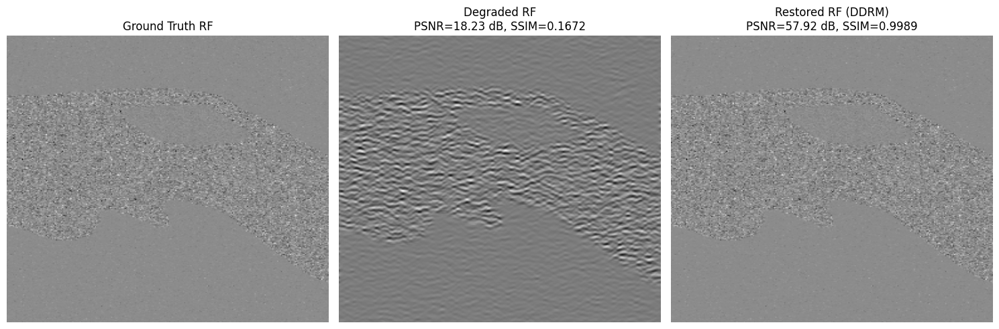

In [9]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load .mat files
output_dir = "mat_output_ddrm"
gt_rf = scipy.io.loadmat(os.path.join(output_dir, 'ground_truth.mat'))
degraded_rf = scipy.io.loadmat(os.path.join(output_dir, 'degraded_y0.mat'))
restored_rf = scipy.io.loadmat(os.path.join(output_dir, 'restored_ddrm.mat'))

# Extract the actual data arrays (ignoring __header__, __version__, etc.)
def extract_main(data):
    for k, v in data.items():
        if not k.startswith('__'):
            return v
gt = extract_main(gt_rf)
degraded = extract_main(degraded_rf)
restored = extract_main(restored_rf)

# Ensure 2D slices for PSNR/SSIM and visualization
gt_img = gt[:, :, 0] if gt.ndim == 3 else gt
degraded_img = degraded[:, :, 0] if degraded.ndim == 3 else degraded
restored_img = restored[:, :, 0] if restored.ndim == 3 else restored

# Normalize to [0, 1] for fair SSIM comparison
def normalize(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-8)

gt_n = normalize(gt_img)
degraded_n = normalize(degraded_img)
restored_n = normalize(restored_img)

# Compute PSNR and SSIM
psnr_deg = psnr(gt_n, degraded_n, data_range=1.0)
ssim_deg = ssim(gt_n, degraded_n, data_range=1.0)
psnr_res = psnr(gt_n, restored_n, data_range=1.0)
ssim_res = ssim(gt_n, restored_n, data_range=1.0)

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
images = [gt_img, degraded_img, restored_img]
titles = [
    "Ground Truth RF",
    f"Degraded RF\nPSNR={psnr_deg:.2f} dB, SSIM={ssim_deg:.4f}",
    f"Restored RF (DDRM)\nPSNR={psnr_res:.2f} dB, SSIM={ssim_res:.4f}"
]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "rf_comparison.png"), dpi=300, bbox_inches='tight')  # Save PNG
plt.show()


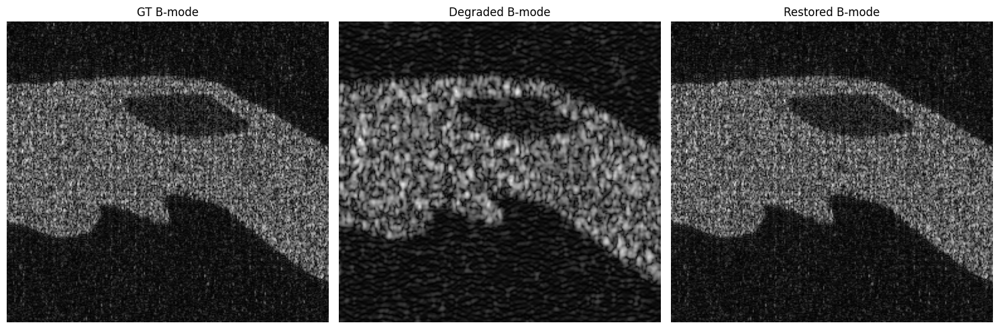

In [10]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --------------------------------------
# Define reusable B-mode conversion + matching
# --------------------------------------
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --------------------------------------
# Load RF data
# --------------------------------------
gt_mat     = scipy.io.loadmat("mat_output_ddrm/ground_truth.mat")
deg_mat    = scipy.io.loadmat("mat_output_ddrm/degraded_y0.mat")
res_mat    = scipy.io.loadmat("mat_output_ddrm/restored_ddrm.mat")

rf_gt      = gt_mat["GT_rf_resized"]
rf_degraded= deg_mat["rf_degraded"]
rf_restored= res_mat["rf_restored"]

# --------------------------------------
# Load Simu-1 ground-truth B-mode
# --------------------------------------
sim1       = scipy.io.loadmat("exp/datasets/anes_data/simu/2/data.mat")
bmode_GT   = sim1["bmode_GT"]

# --------------------------------------
# Match RF→RF and convert to B-mode
# --------------------------------------
rf_deg_matched = match_histograms(rf_degraded, rf_gt, channel_axis=None)
rf_res_matched = match_histograms(rf_restored, rf_gt, channel_axis=None)

bmode_gt_image       = rf_to_matched_bmode(rf_gt,        bmode_GT)
bmode_degraded_image = rf_to_matched_bmode(rf_deg_matched, bmode_GT)
bmode_restored_image = rf_to_matched_bmode(rf_res_matched, bmode_GT)

# --------------------------------------
# Plot side-by-side and save PNG
# --------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(bmode_gt_image,       cmap='gray', aspect='auto'); axes[0].axis('off'); axes[0].set_title("GT B-mode")
axes[1].imshow(bmode_degraded_image, cmap='gray', aspect='auto'); axes[1].axis('off'); axes[1].set_title("Degraded B-mode")
axes[2].imshow(bmode_restored_image, cmap='gray', aspect='auto'); axes[2].axis('off'); axes[2].set_title("Restored B-mode")
plt.tight_layout()
plt.savefig("mat_output_ddrm/bmode_comparison.png", dpi=300, bbox_inches='tight')

# --------------------------------------
# Save individual B-mode images to .mat
# --------------------------------------
scipy.io.savemat("mat_output_ddrm/bmode_degraded.mat", {"bmode_degraded": bmode_degraded_image})
scipy.io.savemat("mat_output_ddrm/bmode_restored.mat", {"bmode_restored": bmode_restored_image})
scipy.io.savemat("mat_output_ddrm/bmode_gt.mat", {"bmode_gt": bmode_gt_image})


In [4]:
!python main_mat_ddrm.py \
  --mat_dir exp/datasets/anes_data/simu/3 \
  --mat_list exp/datasets/anes_data/simu/3/mat_list.txt \
  --key GT_rf \
  --image_size 256 \
  --psf_path exp/datasets/anes_data/simu/3/psf_GT_3.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_ddrm \
  --config deblur_us.yml \
  --doc 3


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO:root:Using device: cuda
INFO:root:Using device: cuda
INFO - main.py - 2025-05-09 15:40:02,210 - Using device: cuda
INFO:root:✅ Model instantiated and checkpoint loaded.
INFO - main_mat_ddrm.py - 2025-05-09 15:40:07,997 - ✅ Model instantiated and checkpoint loaded.
INFO:root:Loading PSF from: exp/datasets/anes_data/simu/3/psf_GT_3.mat
INFO - main_mat_ddrm.py - 2025-05-09 15:40:07,997 - Loading PSF from: ex

In [13]:
import scipy.io
mat = scipy.io.loadmat("exp/datasets/anes_data/simu/3/psf_GT_3.mat")
print(mat.keys())


dict_keys(['__header__', '__version__', '__globals__', 'psf_GT_3'])


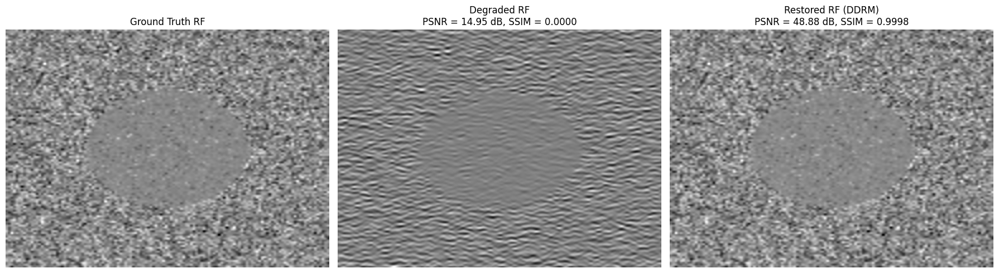

✅ Saved RF comparison to: mat_output_ddrm/rf_comparison_simu3.png


In [6]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim


def load_main_variable(mat_path):
    """Load the first non-meta variable from a .mat file."""
    mat = scipy.io.loadmat(mat_path)
    for k, v in mat.items():
        if not k.startswith('__'):
            return v
    raise ValueError(f"No usable variable found in {mat_path}")


def ensure_2d(img):
    """Ensure the image is 2D (select frame 0 if 3D)."""
    return img[:, :, 0] if img.ndim == 3 else img


def normalize(img):
    """Normalize to [0, 1] safely, removing NaN/Inf."""
    img = np.nan_to_num(img, nan=0.0, posinf=0.0, neginf=0.0)
    r = img.max() - img.min()
    if r < 1e-8:
        return np.zeros_like(img)
    return (img - img.min()) / (r + 1e-8)


def safe_psnr(img1, img2):
    try:
        return psnr(img1, img2, data_range=1.0)
    except Exception:
        return 0.0


def safe_ssim(img1, img2):
    try:
        val = ssim(img1, img2, data_range=1.0)
        return max(0.0, min(1.0, val))  # Clamp to [0, 1]
    except Exception:
        return 0.0


def compare_rf_images(output_dir, tag="simu"):
    """Main function to compare RF images from mat files."""
    # Load RF data
    gt       = ensure_2d(load_main_variable(os.path.join(output_dir, 'ground_truth.mat')))
    degraded = ensure_2d(load_main_variable(os.path.join(output_dir, 'degraded_y0.mat')))
    restored = ensure_2d(load_main_variable(os.path.join(output_dir, 'restored_ddrm.mat')))

    # Normalize for metrics
    gt_n       = normalize(gt)
    degraded_n = normalize(degraded)
    restored_n = normalize(restored)

    # Metrics
    psnr_deg = safe_psnr(gt_n, degraded_n)
    ssim_deg = safe_ssim(gt_n, degraded_n)
    psnr_res = safe_psnr(gt_n, restored_n)
    ssim_res = safe_ssim(gt_n, restored_n)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    images = [gt, degraded, restored]
    titles = [
        "Ground Truth RF",
        f"Degraded RF\nPSNR = {psnr_deg:.2f} dB, SSIM = {ssim_deg:.4f}",
        f"Restored RF (DDRM)\nPSNR = {psnr_res:.2f} dB, SSIM = {ssim_res:.4f}"
    ]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray', aspect='auto')
        ax.set_title(title, fontsize=12)
        ax.axis('off')

    plt.tight_layout()
    out_path = os.path.join(output_dir, f"rf_comparison_{tag}.png")
    plt.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved RF comparison to: {out_path}")


# Example usage
if __name__ == "__main__":
    # Replace 'simu4' and directory path as needed
    compare_rf_images(output_dir="mat_output_ddrm", tag="simu3")


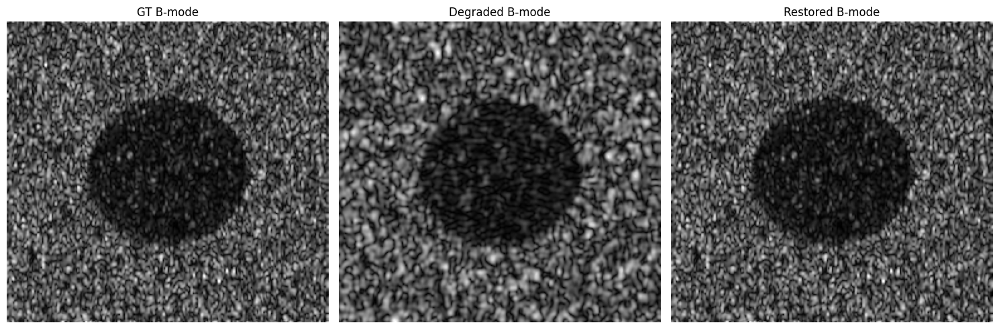

In [7]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --------------------------------------
# Define reusable B-mode conversion + matching
# --------------------------------------
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --------------------------------------
# Load RF data
# --------------------------------------
gt_mat     = scipy.io.loadmat("mat_output_ddrm/ground_truth.mat")
deg_mat    = scipy.io.loadmat("mat_output_ddrm/degraded_y0.mat")
res_mat    = scipy.io.loadmat("mat_output_ddrm/restored_ddrm.mat")

rf_gt      = gt_mat["GT_rf_resized"]
rf_degraded= deg_mat["rf_degraded"]
rf_restored= res_mat["rf_restored"]

# --------------------------------------
# Load Simu-1 ground-truth B-mode
# --------------------------------------
sim1       = scipy.io.loadmat("exp/datasets/anes_data/simu/3/data.mat")
bmode_GT   = sim1["bmode_GT"]

# --------------------------------------
# Match RF→RF and convert to B-mode
# --------------------------------------
rf_deg_matched = match_histograms(rf_degraded, rf_gt, channel_axis=None)
rf_res_matched = match_histograms(rf_restored, rf_gt, channel_axis=None)

bmode_gt_image       = rf_to_matched_bmode(rf_gt,        bmode_GT)
bmode_degraded_image = rf_to_matched_bmode(rf_deg_matched, bmode_GT)
bmode_restored_image = rf_to_matched_bmode(rf_res_matched, bmode_GT)

# --------------------------------------
# Plot side-by-side and save PNG
# --------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(bmode_gt_image,       cmap='gray', aspect='auto'); axes[0].axis('off'); axes[0].set_title("GT B-mode")
axes[1].imshow(bmode_degraded_image, cmap='gray', aspect='auto'); axes[1].axis('off'); axes[1].set_title("Degraded B-mode")
axes[2].imshow(bmode_restored_image, cmap='gray', aspect='auto'); axes[2].axis('off'); axes[2].set_title("Restored B-mode")
plt.tight_layout()
plt.savefig("mat_output_ddrm/bmode_comparison.png", dpi=300, bbox_inches='tight')

# --------------------------------------
# Save individual B-mode images to .mat
# --------------------------------------
scipy.io.savemat("mat_output_ddrm/bmode_degraded.mat", {"bmode_degraded": bmode_degraded_image})
scipy.io.savemat("mat_output_ddrm/bmode_restored.mat", {"bmode_restored": bmode_restored_image})
scipy.io.savemat("mat_output_ddrm/bmode_gt.mat", {"bmode_gt": bmode_gt_image})


In [2]:
import scipy.io

# Load the PSF file
psf_file = 'exp/datasets/anes_data/simu/4/psf_GT_4.mat'
data = scipy.io.loadmat(psf_file)

# Rename the key inside to match expected 'psf_GT_4'
if 'psf_GT_3' in data:
    data['psf_GT_4'] = data.pop('psf_GT_3')
    scipy.io.savemat(psf_file, data)
    print("✅ PSF key renamed successfully to 'psf_GT_4'")
else:
    print("❌ 'psf_GT_3' not found in the file.")


✅ PSF key renamed successfully to 'psf_GT_4'


In [3]:
!python main_mat_ddrm.py \
  --mat_dir exp/datasets/anes_data/simu/4 \
  --mat_list exp/datasets/anes_data/simu/4/mat_list.txt \
  --key GT_rf \
  --image_size 256 \
  --psf_path exp/datasets/anes_data/simu/4/psf_GT_4.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_ddrm \
  --config deblur_us.yml \
  --doc 4


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO:root:Using device: cuda
INFO:root:Using device: cuda
INFO - main.py - 2025-05-09 15:23:56,850 - Using device: cuda
INFO:root:✅ Model instantiated and checkpoint loaded.
INFO - main_mat_ddrm.py - 2025-05-09 15:24:02,500 - ✅ Model instantiated and checkpoint loaded.
INFO:root:Loading PSF from: exp/datasets/anes_data/simu/4/psf_GT_4.mat
INFO - main_mat_ddrm.py - 2025-05-09 15:24:02,500 - Loading PSF from: ex

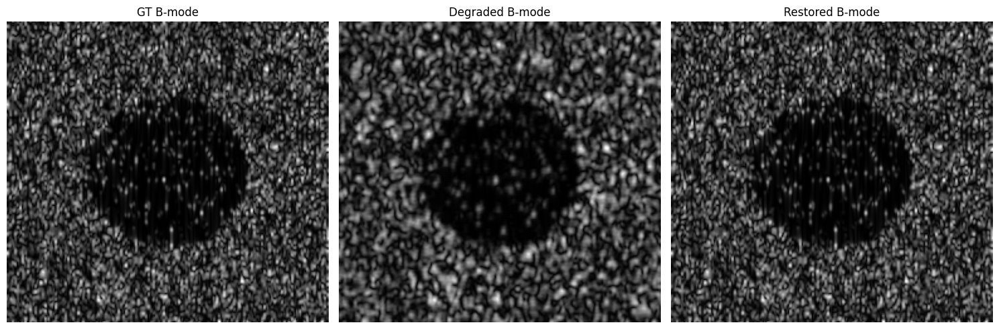

In [3]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --------------------------------------
# Define reusable B-mode conversion + matching
# --------------------------------------
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --------------------------------------
# Load RF data
# --------------------------------------
gt_mat     = scipy.io.loadmat("mat_output_ddrm/ground_truth.mat")
deg_mat    = scipy.io.loadmat("mat_output_ddrm/degraded_y0.mat")
res_mat    = scipy.io.loadmat("mat_output_ddrm/restored_ddrm.mat")

rf_gt      = gt_mat["GT_rf_resized"]
rf_degraded= deg_mat["rf_degraded"]
rf_restored= res_mat["rf_restored"]

# --------------------------------------
# Load Simu-1 ground-truth B-mode
# --------------------------------------
sim1       = scipy.io.loadmat("exp/datasets/anes_data/simu/4/data.mat")
bmode_GT   = sim1["bmode_GT"]

# --------------------------------------
# Match RF→RF and convert to B-mode
# --------------------------------------
rf_deg_matched = match_histograms(rf_degraded, rf_gt, channel_axis=None)
rf_res_matched = match_histograms(rf_restored, rf_gt, channel_axis=None)

bmode_gt_image       = rf_to_matched_bmode(rf_gt,        bmode_GT)
bmode_degraded_image = rf_to_matched_bmode(rf_deg_matched, bmode_GT)
bmode_restored_image = rf_to_matched_bmode(rf_res_matched, bmode_GT)

# --------------------------------------
# Plot side-by-side and save PNG
# --------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(bmode_gt_image,       cmap='gray', aspect='auto'); axes[0].axis('off'); axes[0].set_title("GT B-mode")
axes[1].imshow(bmode_degraded_image, cmap='gray', aspect='auto'); axes[1].axis('off'); axes[1].set_title("Degraded B-mode")
axes[2].imshow(bmode_restored_image, cmap='gray', aspect='auto'); axes[2].axis('off'); axes[2].set_title("Restored B-mode")
plt.tight_layout()
plt.savefig("mat_output_ddrm/bmode_comparison.png", dpi=300, bbox_inches='tight')

# --------------------------------------
# Save individual B-mode images to .mat
# --------------------------------------
scipy.io.savemat("mat_output_ddrm/bmode_degraded.mat", {"bmode_degraded": bmode_degraded_image})
scipy.io.savemat("mat_output_ddrm/bmode_restored.mat", {"bmode_restored": bmode_restored_image})
scipy.io.savemat("mat_output_ddrm/bmode_gt.mat", {"bmode_gt": bmode_gt_image})


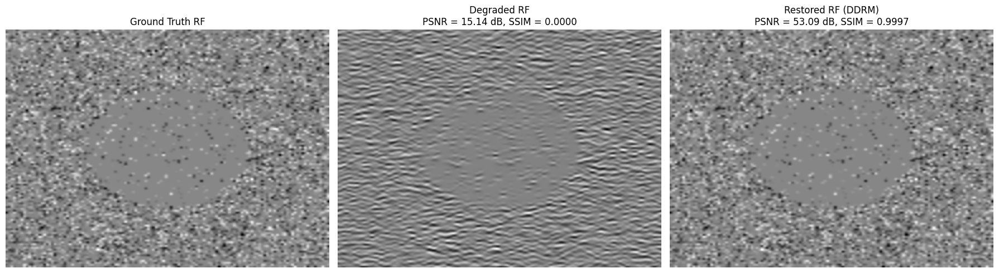

✅ Saved RF comparison to: mat_output_ddrm/rf_comparison_simu4.png


In [2]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim


def load_main_variable(mat_path):
    """Load the first non-meta variable from a .mat file."""
    mat = scipy.io.loadmat(mat_path)
    for k, v in mat.items():
        if not k.startswith('__'):
            return v
    raise ValueError(f"No usable variable found in {mat_path}")


def ensure_2d(img):
    """Ensure the image is 2D (select frame 0 if 3D)."""
    return img[:, :, 0] if img.ndim == 3 else img


def normalize(img):
    """Normalize to [0, 1] safely, removing NaN/Inf."""
    img = np.nan_to_num(img, nan=0.0, posinf=0.0, neginf=0.0)
    r = img.max() - img.min()
    if r < 1e-8:
        return np.zeros_like(img)
    return (img - img.min()) / (r + 1e-8)


def safe_psnr(img1, img2):
    try:
        return psnr(img1, img2, data_range=1.0)
    except Exception:
        return 0.0


def safe_ssim(img1, img2):
    try:
        val = ssim(img1, img2, data_range=1.0)
        return max(0.0, min(1.0, val))  # Clamp to [0, 1]
    except Exception:
        return 0.0


def compare_rf_images(output_dir, tag="simu"):
    """Main function to compare RF images from mat files."""
    # Load RF data
    gt       = ensure_2d(load_main_variable(os.path.join(output_dir, 'ground_truth.mat')))
    degraded = ensure_2d(load_main_variable(os.path.join(output_dir, 'degraded_y0.mat')))
    restored = ensure_2d(load_main_variable(os.path.join(output_dir, 'restored_ddrm.mat')))

    # Normalize for metrics
    gt_n       = normalize(gt)
    degraded_n = normalize(degraded)
    restored_n = normalize(restored)

    # Metrics
    psnr_deg = safe_psnr(gt_n, degraded_n)
    ssim_deg = safe_ssim(gt_n, degraded_n)
    psnr_res = safe_psnr(gt_n, restored_n)
    ssim_res = safe_ssim(gt_n, restored_n)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    images = [gt, degraded, restored]
    titles = [
        "Ground Truth RF",
        f"Degraded RF\nPSNR = {psnr_deg:.2f} dB, SSIM = {ssim_deg:.4f}",
        f"Restored RF (DDRM)\nPSNR = {psnr_res:.2f} dB, SSIM = {ssim_res:.4f}"
    ]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap='gray', aspect='auto')
        ax.set_title(title, fontsize=12)
        ax.axis('off')

    plt.tight_layout()
    out_path = os.path.join(output_dir, f"rf_comparison_{tag}.png")
    plt.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved RF comparison to: {out_path}")


# Example usage
if __name__ == "__main__":
    # Replace 'simu4' and directory path as needed
    compare_rf_images(output_dir="mat_output_ddrm", tag="simu4")


### Vivo Data

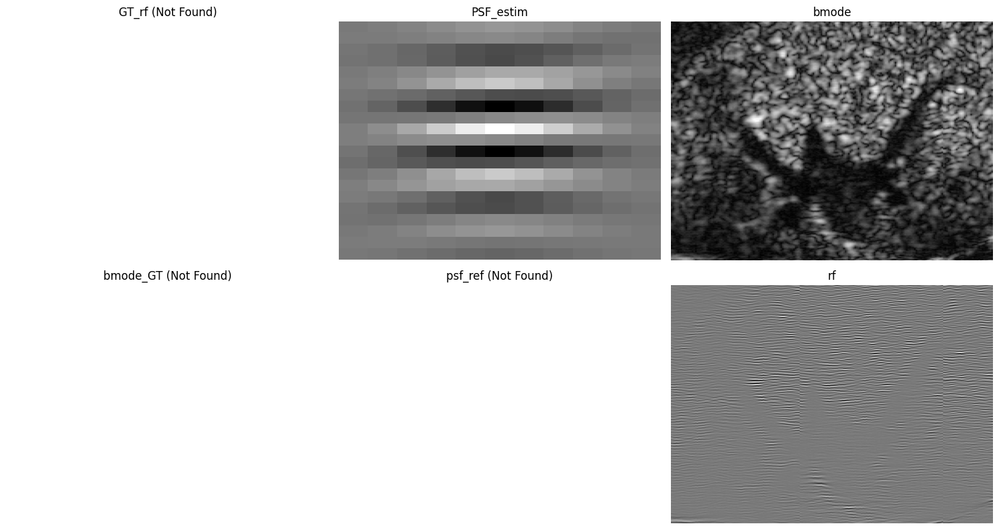

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/vivo/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# Variables to visualize (6 in total)
variables_to_plot = ['GT_rf', 'PSF_estim', 'bmode', 'bmode_GT', 'psf_ref', 'rf']

# Create 2 rows and 3 columns subplot
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()  # Flatten for easy indexing

for i, var in enumerate(variables_to_plot):
    if var not in mat_data:
        axes[i].set_title(f"{var} (Not Found)")
        axes[i].axis('off')
        continue

    data = mat_data[var]
    img = data[:, :, 0] if data.ndim == 3 else data

    axes[i].imshow(img, cmap='gray', aspect='auto')
    axes[i].set_title(var)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


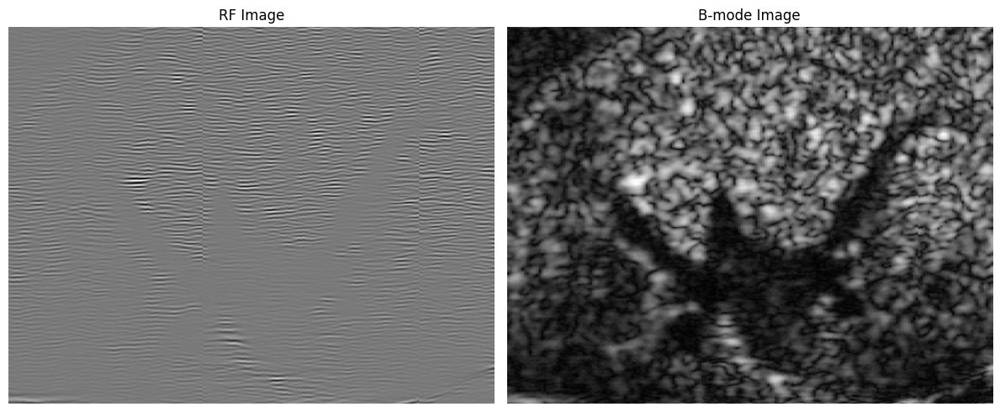

In [10]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# ----------------------------------------
# Load the .mat file (update the path if needed)
# ----------------------------------------
mat_path = "exp/datasets/anes_data/vivo/data.mat"  # Change to your path if necessary
data = scipy.io.loadmat(mat_path)

# ----------------------------------------
# Extract RF and B-mode images
# ----------------------------------------
rf_img = data.get("rf", None)
bmode_img = data.get("bmode", None)

# ----------------------------------------
# Check if both variables exist
# ----------------------------------------
if rf_img is None or bmode_img is None:
    raise KeyError("Missing 'rf' or 'bmode' variable in the .mat file.")

# ----------------------------------------
# Plot side-by-side
# ----------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(rf_img, cmap='gray', aspect='auto')
axes[0].set_title("RF Image")
axes[0].axis("off")

axes[1].imshow(bmode_img, cmap='gray', aspect='auto')
axes[1].set_title("B-mode Image")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [12]:
import scipy.io as sio
import numpy as np

mat = sio.loadmat("exp/datasets/anes_data/vivo/data.mat")
sio.savemat("mat_input_vivo/degraded_y0.mat", {"rf_degraded": mat["rf"]})
sio.savemat("mat_input_vivo/psf_GT_vivo.mat", {"psf_ref": mat["PSF_estim"]})


In [15]:
import scipy.io
import numpy as np
import os

# Load original data.mat (from vivo dataset)
data_path = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(data_path)

# Extract RF and PSF
rf = data['rf']                  # shape: (401, 200)
psf = data['PSF_estim']          # shape: (21, 11)

# Output folder
output_dir = "mat_input_vivo"
os.makedirs(output_dir, exist_ok=True)

# Save RF as degraded_y0.mat with key 'rf_degraded'
scipy.io.savemat(os.path.join(output_dir, "degraded_y0.mat"), {'rf_degraded': rf})

# Save PSF as psf_GT_vivo.mat with key 'psf_ref'
scipy.io.savemat(os.path.join(output_dir, "psf_GT_vivo.mat"), {'psf_ref': psf})

# Write mat_list.txt file
with open(os.path.join(output_dir, "mat_list.txt"), 'w') as f:
    f.write("degraded_y0.mat\n")

print("✅ Prepared mat_input_vivo folder with:")
print("- degraded_y0.mat (key: rf_degraded)")
print("- psf_GT_vivo.mat (key: psf_ref)")
print("- mat_list.txt")


✅ Prepared mat_input_vivo folder with:
- degraded_y0.mat (key: rf_degraded)
- psf_GT_vivo.mat (key: psf_ref)
- mat_list.txt


In [1]:
!python main_mat_ddrm.py \
  --mat_dir mat_input_vivo \
  --mat_list mat_input_vivo/mat_list.txt \
  --key rf_degraded \
  --image_size 256 \
  --psf_path mat_input_vivo/psf_GT_vivo.mat \
  --model_path exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --timesteps 20 \
  --eta 0.85 \
  --etaB 1.0 \
  --deg deblur_bccb \
  --sigma_0 0 \
  --output_dir mat_output_vivo \
  --config deblur_us.yml \
  --doc vivo


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
INFO:root:Using device: cuda
INFO:root:Using device: cuda
INFO - main.py - 2025-05-13 13:08:09,383 - Using device: cuda
INFO:root:✅ Model instantiated and checkpoint loaded.
INFO - main_mat_ddrm.py - 2025-05-13 13:08:15,493 - ✅ Model instantiated and checkpoint loaded.
INFO:root:Loading PSF from: mat_input_vivo/psf_GT_vivo.mat
INFO - main_mat_ddrm.py - 2025-05-13 13:08:15,493 - Loading PSF from: mat_input_vivo

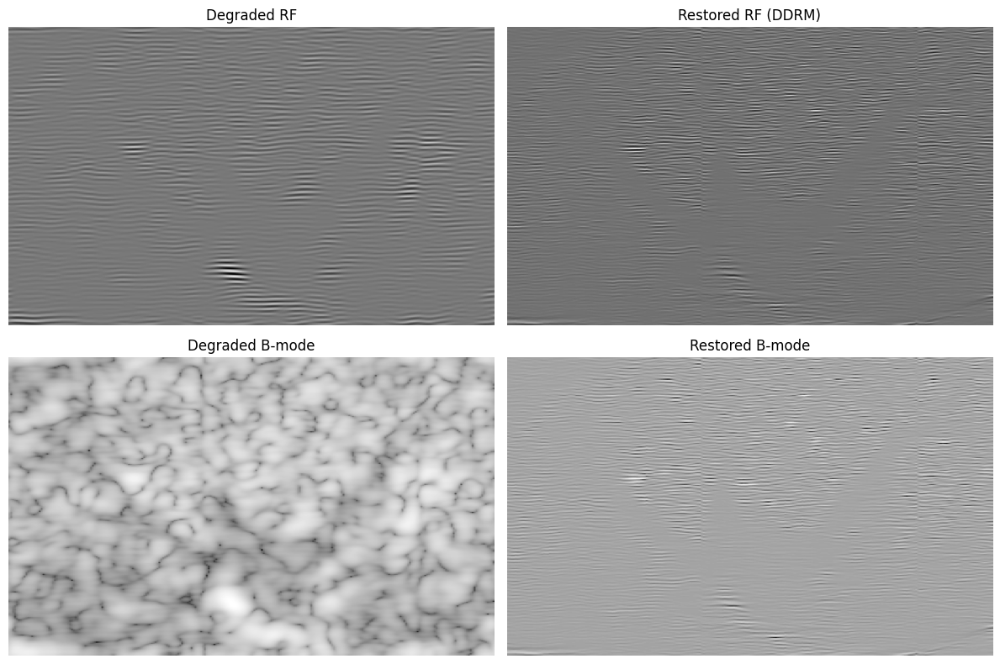

In [17]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
import os

# Load the restored and degraded RF data
output_dir = "mat_output_vivo"
restored_rf = scipy.io.loadmat(os.path.join(output_dir, "restored_ddrm.mat"))["rf_restored"]
degraded_rf = scipy.io.loadmat(os.path.join(output_dir, "degraded_y0.mat"))["rf_degraded"]

# Convert RF to B-mode using log-compressed envelope detection
def rf_to_bmode(RF, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db = 255 * db / db.max()
    return db.astype(np.uint8)

bmode_restored = rf_to_bmode(restored_rf)
bmode_degraded = rf_to_bmode(degraded_rf)

# Plot and save RF and B-mode images side by side
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

axs[0, 0].imshow(degraded_rf, cmap='gray', aspect='auto')
axs[0, 0].set_title("Degraded RF")
axs[0, 0].axis('off')

axs[0, 1].imshow(restored_rf, cmap='gray', aspect='auto')
axs[0, 1].set_title("Restored RF (DDRM)")
axs[0, 1].axis('off')

axs[1, 0].imshow(bmode_degraded, cmap='gray', aspect='auto')
axs[1, 0].set_title("Degraded B-mode")
axs[1, 0].axis('off')

axs[1, 1].imshow(bmode_restored, cmap='gray', aspect='auto')
axs[1, 1].set_title("Restored B-mode")
axs[1, 1].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "vivo_rf_bmode_comparison.png"), dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --------------------------------------
# Define reusable B-mode conversion + matching
# --------------------------------------
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --------------------------------------
# Load RF data
# --------------------------------------
gt_mat     = scipy.io.loadmat("mat_output_vivo/ground_truth.mat")
deg_mat    = scipy.io.loadmat("mat_output_vivo/degraded_y0.mat")
res_mat    = scipy.io.loadmat("mat_output_vivo/restored_ddrm.mat")

rf_gt      = gt_mat["GT_rf_resized"]
rf_degraded= deg_mat["rf_degraded"]
rf_restored= res_mat["rf_restored"]

# --------------------------------------
# Load Simu-1 ground-truth B-mode
# --------------------------------------
# ----------------------------------------
# Load the .mat file (update the path if needed)
# ----------------------------------------
mat_path = "exp/datasets/anes_data/vivo/data.mat"  # Change to your path if necessary
data = scipy.io.loadmat(mat_path)

# ----------------------------------------
# Extract RF and B-mode images
# ----------------------------------------
rf_img = data.get("rf", None)
bmode_img = data.get("bmode", None)
sim1       = scipy.io.loadmat("exp/datasets/anes_data/vivo/data.mat")
bmode_GT   = sim1["bmode_GT"]

# --------------------------------------
# Match RF→RF and convert to B-mode
# --------------------------------------
rf_deg_matched = match_histograms(rf_degraded, rf_gt, channel_axis=None)
rf_res_matched = match_histograms(rf_restored, rf_gt, channel_axis=None)

bmode_gt_image       = rf_to_matched_bmode(rf_gt,        bmode_GT)
bmode_degraded_image = rf_to_matched_bmode(rf_deg_matched, bmode_GT)
bmode_restored_image = rf_to_matched_bmode(rf_res_matched, bmode_GT)

# --------------------------------------
# Plot side-by-side and save PNG
# --------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(bmode_gt_image,       cmap='gray', aspect='auto'); axes[0].axis('off'); axes[0].set_title("GT B-mode")
axes[1].imshow(bmode_degraded_image, cmap='gray', aspect='auto'); axes[1].axis('off'); axes[1].set_title("Degraded B-mode")
axes[2].imshow(bmode_restored_image, cmap='gray', aspect='auto'); axes[2].axis('off'); axes[2].set_title("Restored B-mode")
plt.tight_layout()
plt.savefig("mat_output_ddrm/bmode_comparison.png", dpi=300, bbox_inches='tight')

# --------------------------------------
# Save individual B-mode images to .mat
# --------------------------------------
scipy.io.savemat("mat_output_ddrm/bmode_degraded.mat", {"bmode_degraded": bmode_degraded_image})
scipy.io.savemat("mat_output_ddrm/bmode_restored.mat", {"bmode_restored": bmode_restored_image})
scipy.io.savemat("mat_output_ddrm/bmode_gt.mat", {"bmode_gt": bmode_gt_image})


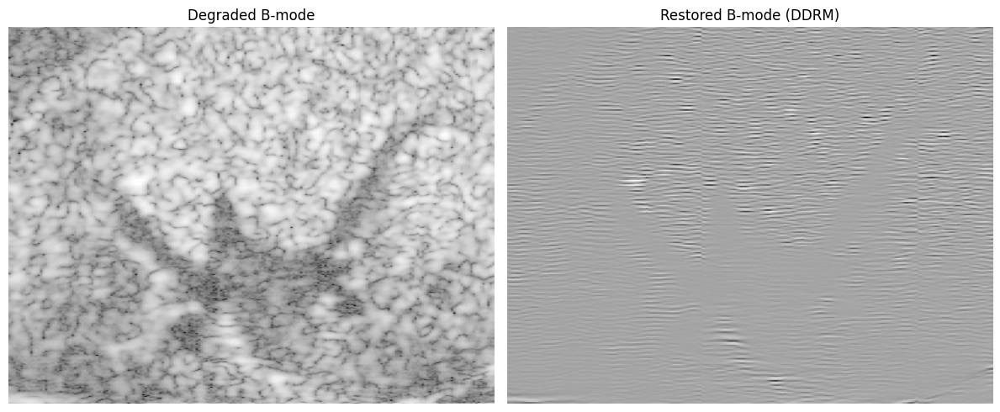

In [1]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# -------------------------------
# B-mode conversion (no matching)
# -------------------------------
def rf_to_bmode(RF: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    return np.clip(db, 0, 255).astype(np.uint8)

# -------------------------------
# Load vivo RF data
# -------------------------------
res_mat = scipy.io.loadmat("mat_output_vivo/restored_ddrm.mat")
deg_mat = scipy.io.loadmat("mat_input_vivo/degraded_y0.mat")

rf_restored = res_mat["rf_restored"]
rf_degraded = deg_mat["rf_degraded"]

# -------------------------------
# Convert to B-mode (no matching)
# -------------------------------
bmode_degraded = rf_to_bmode(rf_degraded)
bmode_restored = rf_to_bmode(rf_restored)

# -------------------------------
# Plot and Save Comparison
# -------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(bmode_degraded, cmap='gray', aspect='auto')
axes[0].set_title("Degraded B-mode")
axes[0].axis('off')

axes[1].imshow(bmode_restored, cmap='gray', aspect='auto')
axes[1].set_title("Restored B-mode (DDRM)")
axes[1].axis('off')

plt.tight_layout()
plt.savefig("mat_output_vivo/bmode_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

# -------------------------------
# Save individual B-mode images
# -------------------------------
scipy.io.savemat("mat_output_vivo/bmode_degraded.mat", {"bmode_degraded": bmode_degraded})
scipy.io.savemat("mat_output_vivo/bmode_restored.mat", {"bmode_restored": bmode_restored})


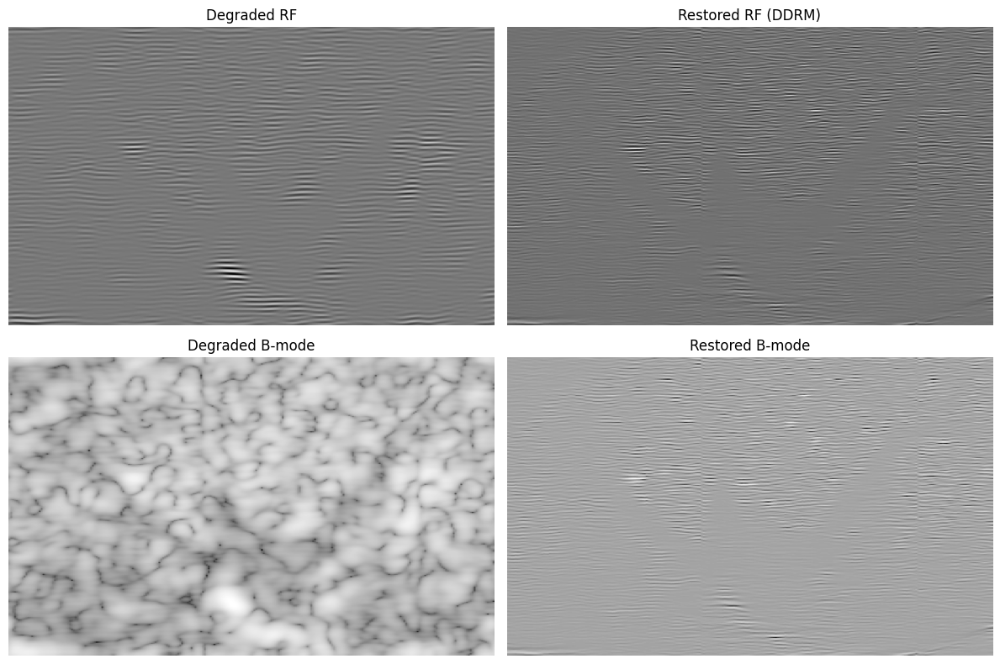

In [2]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# ----------------------------
# B-mode conversion function
# ----------------------------
def rf_to_bmode(RF, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    log_env = 20.0 * np.log10(env + increase)
    log_env = np.clip(log_env, -60, None)
    log_env -= log_env.min()
    return (255 * log_env / log_env.max()).astype(np.uint8)

# ----------------------------
# Load RF data
# ----------------------------
output_dir = "mat_output_vivo"
rf_degraded = scipy.io.loadmat(f"{output_dir}/degraded_y0.mat")['rf_degraded']
rf_restored = scipy.io.loadmat(f"{output_dir}/restored_ddrm.mat")['rf_restored']

# Ensure shape is 2D
rf_degraded_img = rf_degraded[:, :, 0] if rf_degraded.ndim == 3 else rf_degraded
rf_restored_img = rf_restored[:, :, 0] if rf_restored.ndim == 3 else rf_restored

# ----------------------------
# Convert to B-mode
# ----------------------------
bmode_degraded = rf_to_bmode(rf_degraded_img)
bmode_restored = rf_to_bmode(rf_restored_img)

# ----------------------------
# Plot RF and B-mode side by side
# ----------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0, 0].imshow(rf_degraded_img, cmap='gray', aspect='auto')
axes[0, 0].set_title("Degraded RF")
axes[0, 0].axis('off')

axes[0, 1].imshow(rf_restored_img, cmap='gray', aspect='auto')
axes[0, 1].set_title("Restored RF (DDRM)")
axes[0, 1].axis('off')

axes[1, 0].imshow(bmode_degraded, cmap='gray', aspect='auto')
axes[1, 0].set_title("Degraded B-mode")
axes[1, 0].axis('off')

axes[1, 1].imshow(bmode_restored, cmap='gray', aspect='auto')
axes[1, 1].set_title("Restored B-mode")
axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig(f"{output_dir}/vivo_rf_bmode_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

# ----------------------------
# Optionally save B-modes
# ----------------------------
scipy.io.savemat(f"{output_dir}/bmode_degraded.mat", {"bmode_degraded": bmode_degraded})
scipy.io.savemat(f"{output_dir}/bmode_restored.mat", {"bmode_restored": bmode_restored})


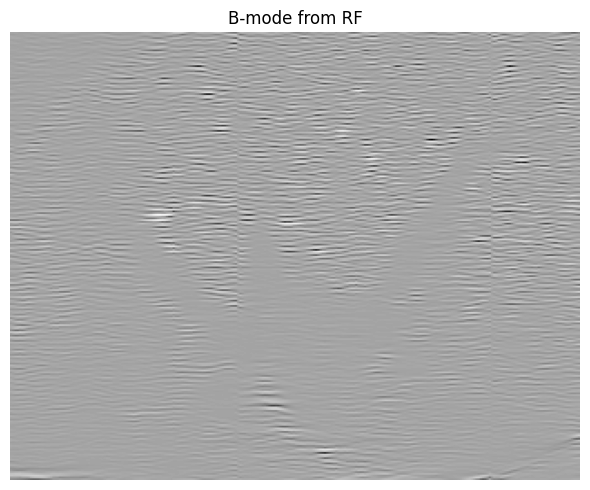

In [4]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert

# Load RF data
rf = scipy.io.loadmat("mat_output_vivo/restored_ddrm.mat")["rf_restored"]

# Convert to B-mode
env = np.abs(hilbert(rf, axis=0))
log_env = 20.0 * np.log10(env + 1e-6)
log_env = np.clip(log_env, -60, None)
log_env -= log_env.min()
bmode = (255.0 * log_env / log_env.max()).astype(np.uint8)

# Visualize
plt.figure(figsize=(6, 5))
plt.imshow(bmode, cmap='gray', aspect='auto')
plt.title("B-mode from RF")
plt.axis('off')
plt.tight_layout()
plt.show()


In [13]:
!mkdir -p mat_input_vivo


In [19]:
import scipy.io
import os

# Load original vivo data
mat = scipy.io.loadmat("exp/datasets/anes_data/vivo/data.mat")

# Create folder
os.makedirs("mat_input_vivo", exist_ok=True)

# Save RF and PSF
scipy.io.savemat("mat_input_vivo/degraded_y0.mat", {"rf": mat["rf"]})
scipy.io.savemat("mat_input_vivo/psf_GT_vivo.mat", {"psf_ref": mat["PSF_estim"]})

# Save mat_list.txt
with open("mat_input_vivo/mat_list.txt", "w") as f:
    f.write("degraded_y0.mat\n")


In [1]:
import numpy as np
import scipy.io
from scipy.ndimage import zoom
import os

# ------------------------
# Configuration
# ------------------------
input_mat_path = "exp/datasets/anes_data/vivo/data.mat"  # Your original file
output_mat_path = "mat_input_vivo/degraded_y0.mat"       # Resized and normalized for DDRM
key = "rf"                                               # RF key in vivo file

# ------------------------
# Load the RF data
# ------------------------
mat = scipy.io.loadmat(input_mat_path)
rf = mat[key]  # shape should be (401, 200)

print(f"Original RF shape: {rf.shape}")

# ------------------------
# Resize to 256×256 using bilinear interpolation
# ------------------------
target_shape = (256, 256)
zoom_factors = (target_shape[0] / rf.shape[0], target_shape[1] / rf.shape[1])
rf_resized = zoom(rf, zoom_factors, order=1)

print(f"Resized RF shape: {rf_resized.shape}")

# ------------------------
# Normalize to [−1, 1] for DDRM model
# ------------------------
rf_resized = rf_resized.astype(np.float32)
rf_resized -= rf_resized.min()
rf_resized /= (rf_resized.max() + 1e-8)
rf_resized = rf_resized * 2 - 1  # now in range [-1, 1]

# ------------------------
# Save to .mat
# ------------------------
os.makedirs("mat_input_vivo", exist_ok=True)
scipy.io.savemat(output_mat_path, {"rf": rf_resized})
print(f"✅ Saved resized RF to: {output_mat_path}")


Original RF shape: (401, 200)
Resized RF shape: (256, 256)
✅ Saved resized RF to: mat_input_vivo/degraded_y0.mat
